In [2]:
import pandas as pd
import numpy as np

import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode()

import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import k_means

## read in data

In [2]:
acc2080 = pd.read_csv("../satellite_models/Balanced2080Genes_LogRegAccuracies_L1.csv")
coef2080 = pd.read_csv("../satellite_models/Balanced2080Genes_LogRegCoefficients_L1.csv", index_col="feature")

In [3]:
#need features to be cols, genes want to cluster to be rows for sklearn, so transform
Tcoef = coef2080.transpose()
Tcoef.head()

feature,latitude,longitude,depth_sampled,chl_satellite,sst_satellite,par_satellite,pic_satellite,poc_satellite,npp_satellite,calcite_annual_historical,...,phosphate_annual_historical,phosphate_monthly_historical,salinity_annual_historical,salinity_monthly_historical,silicate_annual_historical,silicate_monthly_historical,sst_annual_historical,oceantemp_monthly_historical,oceantemp_annual_historical,intercept
fig|1123864.3.peg.533|VBISARClu237429_0533|,0.458095,0.000000,-0.147737,0.000000,0.000000,0.0,-0.305883,0.000000,0.547003,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,-1.331214,0.000000,0.0,-0.151648
fig|1123864.3.rna.19|VBISARClu237429_r019|,0.208705,-0.040573,0.000000,-0.011806,-0.213160,0.0,0.000000,0.397006,0.000000,0.053152,...,0.0,0.0,0.000000,-0.039014,0.0,0.0,0.000000,-0.467554,0.0,0.205250
fig|1123864.3.rna.21|VBISARClu237429_r021|,0.000000,-0.934064,0.000000,-0.469919,-0.103870,0.0,0.000000,0.000000,-0.106675,0.000000,...,0.0,0.0,-0.384427,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.988377
fig|1123864.3.rna.25|VBISARClu237429_r025|,0.000000,-0.810928,0.000000,-0.264081,-0.134507,0.0,0.000000,0.000000,0.000000,0.009634,...,0.0,0.0,-0.271082,0.000000,0.0,0.0,0.000000,0.000000,0.0,1.064433
fig|1123864.3.rna.9|VBISARClu237429_r009|,0.000000,-0.872105,-0.215728,-0.197604,-0.083592,0.0,0.000000,0.000000,-0.113893,0.000000,...,0.0,0.0,-0.443075,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.142780


# choose number clusters - going with k=5

In [9]:
#cluster sites; just use default settings for this 
n_clusters = []
inertias = []
dists = []
for cluster_candidate in range(1,20):
    print("training for k =",cluster_candidate)
    n_clusters.append(cluster_candidate)
    clusters = k_means(Tcoef,n_clusters=cluster_candidate, random_state=1423)
    inertias.append(clusters[2])
    
    from scipy.spatial.distance import squareform, pdist
    centroids = pd.DataFrame(clusters[0],columns=Tcoef.columns)
    centroids = centroids.transpose()
    dist = pd.DataFrame(squareform(pdist(centroids.T)), columns=centroids.columns, index=centroids.columns)
    dists.append(np.mean(np.mean(dist)))


training for k = 1
training for k = 2
training for k = 3
training for k = 4
training for k = 5
training for k = 6
training for k = 7
training for k = 8
training for k = 9
training for k = 10
training for k = 11
training for k = 12
training for k = 13
training for k = 14
training for k = 15
training for k = 16
training for k = 17
training for k = 18
training for k = 19


In [10]:
#how many clusters to use?
trace1 = go.Scatter(
    x = n_clusters,
    y = inertias,
    mode = 'lines+markers'
    )
py.offline.iplot([trace1], filename='inertias')

In [11]:
#how many clusters to use?
trace1 = go.Scatter(
    x = n_clusters,
    y = dists,
    mode = 'lines+markers'
    )
py.offline.iplot([trace1], filename='inertias')

# look at k=4, k=5, k=6, k=7, k=9 more closely 

## train clusters at k=4,5,6,7,9

In [6]:
#define feat order so can reorder into expected order 
general_feats = ['latitude', 'longitude', 'depth_sampled']
satellite_feats = ['chl_satellite', 'sst_satellite', 'par_satellite', 'pic_satellite', 'poc_satellite', 'npp_satellite']
monthly_feats = ['chla_monthly_historical', 'cloudfraction_monthly_historical', 'daylength_monthly_historical', 
                 'dustflux_monthly_historical', 'solarinsolation_monthly_historical', 'pycnoclinedepth_monthly_historical',
                 'thermoclinedepth_monthly_historical', 'nitrate_monthly_historical', 'npratio_monthly_historical',
                 'oxygendissolved_monthly_historical', 'oxygensaturation_monthly_historical', 'oxygenutilization_monthly_historical',
                 'phosphate_monthly_historical', 'salinity_monthly_historical', 'silicate_monthly_historical', 'oceantemp_monthly_historical'
                ]
annual_feats = ['chla_annual_historical', 'chla_annualrange_historical', 'cloudfraction_annual_historical', 'cloudfraction_annualstdev_historical',
                'diffuseattenuation_annual_historical', 'par_annual_historical', 'salinity_annual_historical',
                'thermoclinedepth_annualstdev_historical', 'nitrate_annual_historical', 'solarinsolation_annual_historical',
                'distfromland_annual_historical', 'oxygendissolved_annual_historical', 'sst_annual_historical', 
                'pycnoclinedepth_annualstdev_historical', 'solarinsolation_annualstdev_historical', 'oceandepth_historical', 
                'dustflux_annual_historical', 'oxygensaturation_annual_historical', 'dustflux_annualstdev_historical', 
                'oxygenutilization_annual_historical', 'phosphate_annual_historical', 'silicate_annual_historical', 
                'calcite_annual_historical', 'oceantemp_annual_historical', 'ph_annual_historical'
                ]

feat_order = general_feats+satellite_feats+monthly_feats+annual_feats+['intercept']

In [65]:
#train and save centroids and cluster labels for diff k
for k in [4,5,6,7,9]:
    print("training clusters for k =", k)
    clusters = k_means(Tcoef,n_clusters=k, random_state=1423)
    cluster_names = ['cluster'+str(num) for num in range(1,k+1)]
    
    centroids = pd.DataFrame(clusters[0],columns=Tcoef.columns,index=cluster_names)
    #need to transpose so each column is a vector of feats
    centroids = centroids.transpose()
    centroids = centroids.reindex(feat_order)
    
    labels = pd.DataFrame({"gene":Tcoef.index, "cluster":clusters[1]+1})
    
    centroids.to_csv("centroidsk"+str(k)+".csv")
    labels.to_csv("clusterlabelsk"+str(k)+".csv", index=False)

training clusters for k = 4
training clusters for k = 5
training clusters for k = 6
training clusters for k = 7
training clusters for k = 9


In [4]:
#read these in separately

centroids4 = pd.read_csv("clusterKtuning/centroidsk4.csv", index_col="feature")
centroids5 = pd.read_csv("centroidsk5.csv", index_col="feature")
centroids6 = pd.read_csv("clusterKtuning/centroidsk6.csv", index_col="feature")
centroids7 = pd.read_csv("clusterKtuning/centroidsk7.csv", index_col="feature")
centroids9 = pd.read_csv("clusterKtuning/centroidsk9.csv", index_col="feature")

labels4 = pd.read_csv("clusterKtuning/clusterlabelsk4.csv")
labels5 = pd.read_csv("clusterlabelsk5.csv")
labels6 = pd.read_csv("clusterKtuning/clusterlabelsk6.csv")
labels7 = pd.read_csv("clusterKtuning/clusterlabelsk7.csv")
labels9 = pd.read_csv("clusterKtuning/clusterlabelsk9.csv")

## cluster evenness

Counter({3: 6478, 1: 6289, 2: 3303, 5: 3224, 6: 2611, 4: 2412})


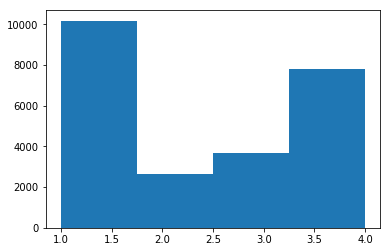

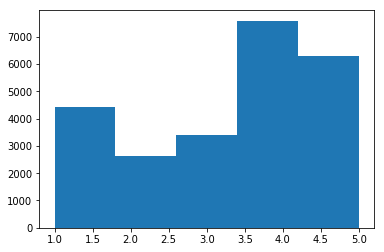

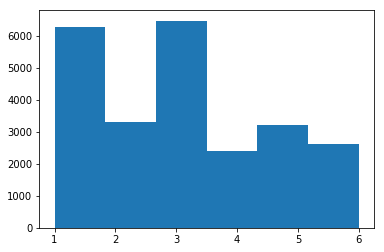

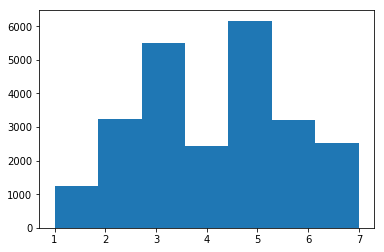

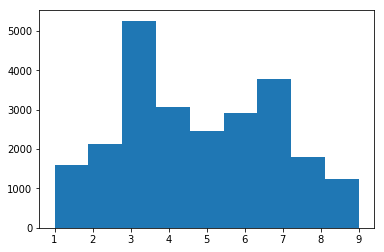

In [83]:
from collections import Counter
print(Counter(labels['cluster']))
plt.hist(labels4['cluster'], bins=4)
plt.figure()
plt.hist(labels5['cluster'], bins=5)
plt.figure()
plt.hist(labels6['cluster'], bins=6)
plt.figure()
plt.hist(labels7['cluster'], bins=7)
plt.figure()
plt.hist(labels9['cluster'], bins=9)
plt.show()

## heatmap of centroids

In [7]:
#k4
centroids4_heatmap = centroids4.reindex(feat_order)

trace = go.Heatmap(z=[list(centroids4_heatmap[column][1:]) for column in centroids4_heatmap.columns],
                   x=centroids4_heatmap.index[1:],
                   y=centroids4_heatmap.columns,
                   colorscale=[[0.0, 'rgb(40,0,255)'],[0.4, 'rgb(255,255,255)'], [0.6, 'rgb(255,255,255)'], [1.0, 'rgb(255,0,40)']],
                   zmin=-2,
                   zmax=2
                  )
data=[trace]
py.offline.iplot(data, filename='cluster4-heatmap')

In [90]:
print(np.mean(centroids5))
print(np.std(centroids5))
print(np.min(centroids5))
print(np.max(centroids5))

cluster1   -0.050873
cluster2   -0.051059
cluster3   -0.049498
cluster4   -0.005542
cluster5   -0.010031
dtype: float64
cluster1    0.272231
cluster2    0.256232
cluster3    0.399631
cluster4    0.209222
cluster5    0.210533
dtype: float64
cluster1   -1.229621
cluster2   -1.006533
cluster3   -2.425814
cluster4   -0.532879
cluster5   -0.739576
dtype: float64
cluster1    0.502970
cluster2    0.837770
cluster3    0.916298
cluster4    0.950241
cluster5    0.583253
dtype: float64


In [251]:
#k5
centroids5_heatmap = centroids5.reindex(feat_order)

trace = go.Heatmap(z=[list(centroids5_heatmap[column][1:]) for column in centroids5_heatmap.columns],
                   x=centroids5_heatmap.index[1:],
                   y=centroids5_heatmap.columns,
                   colorscale=[[0.0, 'rgb(40,0,255)'],[0.45, 'rgb(255,255,255)'], [0.55, 'rgb(255,255,255)'], [1.0, 'rgb(255,0,40)']],
                   zmin=-1.25,
                   zmax=1.25
                  )

layout = go.Layout(
            xaxis = dict(
                  domain = [0.1, 1]
                ),
            yaxis = dict(
                  domain = [0.2, 1]
                ),
            width = 1000,
            height = 700,
            margin=go.Margin(
                l=25,
                r=25,
                b=200,
                t=25,
                pad=4
            ),
        )

fig = go.Figure(data=[trace], layout=layout)
py.offline.iplot(fig)

In [257]:
from collections import Counter
Counter(labels5['cluster'])



Counter({1: 4435, 2: 2630, 3: 3395, 4: 7583, 5: 6274})

In [263]:
for clust in centroids5.columns:
    sort = centroids5[clust].abs()
    centroids5['sort'] = sort
    print('-----',clust,'-----')
    print(centroids5.sort_values('sort', ascending=False).head(10))

centroids5.drop('sort', axis=1)

----- cluster1 -----
                                    cluster1  cluster2  cluster3  cluster4  \
feature                                                                      
oceantemp_monthly_historical       -1.229621  0.065907  0.032804 -0.002681   
dustflux_monthly_historical        -0.749405  0.003472 -0.396801 -0.532879   
phosphate_annual_historical        -0.662722  0.022436 -0.108516 -0.060661   
pycnoclinedepth_monthly_historical  0.502970  0.033961 -0.234583  0.113500   
silicate_annual_historical         -0.402657  0.068318  0.004938 -0.010497   
intercept                          -0.395469 -0.860165 -0.390381  0.003766   
sst_annual_historical               0.359480 -0.011144  0.869847  0.950241   
nitrate_annual_historical          -0.356527  0.002132  0.002056  0.000360   
salinity_monthly_historical         0.328024  0.003174  0.157751  0.270765   
ph_annual_historical               -0.296881  0.140865 -0.298187 -0.408672   

                                    cluste

,cluster1,cluster2,cluster3,cluster4,cluster5
feature,,,,,
latitude,-0.209397,-1.738541e-01,-1.619840e-02,-0.177475,0.137130
longitude,0.226953,-1.006533e+00,9.162981e-01,0.421757,0.090614
depth_sampled,0.056398,-4.052694e-03,3.707091e-02,0.108544,0.011569
chl_satellite,-0.002537,-4.871187e-04,-2.385245e-18,-0.000794,-0.001281
sst_satellite,-0.073281,1.550256e-03,4.870851e-02,-0.017291,-0.118996
par_satellite,0.060779,-4.892116e-02,3.761492e-02,-0.070333,0.305361
pic_satellite,-0.179243,-1.231421e-02,-8.263669e-04,-0.032883,-0.416385
poc_satellite,0.149486,2.037866e-02,-1.091125e-01,0.114559,0.217689
npp_satellite,0.030758,-2.070638e-03,-2.463051e-04,-0.000887,0.051763


In [9]:
#k6
centroids6_heatmap = centroids6.reindex(feat_order)

trace = go.Heatmap(z=[list(centroids6_heatmap[column][1:]) for column in centroids6_heatmap.columns],
                   x=centroids6_heatmap.index[1:],
                   y=centroids6_heatmap.columns,
                   colorscale=[[0.0, 'rgb(40,0,255)'],[0.4, 'rgb(255,255,255)'], [0.6, 'rgb(255,255,255)'], [1.0, 'rgb(255,0,40)']],
                   zmin=-2,
                   zmax=2
                  )
data=[trace]
py.offline.iplot(data, filename='cluster6-heatmap')

In [36]:
#k7
centroids7_heatmap = centroids7.reindex(feat_order)

trace = go.Heatmap(z=[list(centroids7_heatmap[column][1:]) for column in centroids7_heatmap.columns],
                   x=centroids7_heatmap.index[1:],
                   y=centroids7_heatmap.columns,
                   colorscale=[[0.0, 'rgb(40,0,255)'],[0.4, 'rgb(255,255,255)'], [0.6, 'rgb(255,255,255)'], [1.0, 'rgb(255,0,40)']],
                   zmin=-2,
                   zmax=2
                  )
data=[trace]
py.offline.iplot(data, filename='cluster7-heatmap')

In [37]:
#k9
centroids9_heatmap = centroids9.reindex(feat_order)

trace = go.Heatmap(z=[list(centroids9_heatmap[column][1:]) for column in centroids9_heatmap.columns],
                   x=centroids9_heatmap.index[1:],
                   y=centroids9_heatmap.columns,
                   colorscale=[[0.0, 'rgb(40,0,255)'],[0.4, 'rgb(255,255,255)'], [0.6, 'rgb(255,255,255)'], [1.0, 'rgb(255,0,40)']],
                   zmin=-2,
                   zmax=2
                  )
data=[trace]
py.offline.iplot(data, filename='cluster9-heatmap')

## compare cluster similarities of clusters across diff k

In [60]:
#k4 vs k7
from scipy.spatial import distance
clustdist47 = pd.DataFrame()
for col4 in centroids4.columns:
    for col7 in centroids7.columns:
        dist = distance.euclidean(centroids4[col4],centroids7[col7])
        clustdist47.loc[col4,col7] = dist
clustdist47.columns = centroids7.columns
clustdist47.index = centroids4.columns

trace = go.Heatmap(z=[list(clustdist47[column]) for column in clustdist47.columns],
                   x=clustdist47.index,
                   y=clustdist47.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

In [61]:
#k4 vs k9
from scipy.spatial import distance
clustdist49 = pd.DataFrame()
for col4 in centroids4.columns:
    for col9 in centroids9.columns:
        dist = distance.euclidean(centroids4[col4],centroids9[col9])
        clustdist49.loc[col4,col9] = dist
clustdist49.columns = centroids9.columns
clustdist49.index = centroids4.columns

trace = go.Heatmap(z=[list(clustdist49[column]) for column in clustdist49.columns],
                   x=clustdist49.index,
                   y=clustdist49.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

In [63]:
#k7 vs k9
from scipy.spatial import distance
clustdist79 = pd.DataFrame()
for col7 in centroids7.columns:
    for col9 in centroids9.columns:
        dist = distance.euclidean(centroids7[col7],centroids9[col9])
        clustdist79.loc[col7,col9] = dist
clustdist79.columns = centroids9.columns
clustdist79.index = centroids7.columns

trace = go.Heatmap(z=[list(clustdist79[column]) for column in clustdist79.columns],
                   x=clustdist79.index,
                   y=clustdist79.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

In [69]:
#k5 vs k7
from scipy.spatial import distance
clustdist75 = pd.DataFrame()
for col7 in centroids7.columns:
    for col5 in centroids5.columns:
        dist = distance.euclidean(centroids7[col7],centroids5[col5])
        clustdist75.loc[col7,col5] = dist
clustdist75.columns = centroids5.columns
clustdist75.index = centroids7.columns

trace = go.Heatmap(z=[list(clustdist75[column]) for column in clustdist75.columns],
                   x=clustdist75.index,
                   y=clustdist75.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

five and six clusters look pretty different still. two k5 clusters being split in ~two

In [71]:
#k7 vs k6
from scipy.spatial import distance
clustdist67 = pd.DataFrame()
for col6 in centroids6.columns:
    for col7 in centroids7.columns:
        dist = distance.euclidean(centroids6[col6],centroids7[col7])
        clustdist67.loc[col6,col7] = dist
clustdist67.columns = centroids7.columns
clustdist67.index = centroids6.columns

trace = go.Heatmap(z=[list(clustdist67[column]) for column in clustdist67.columns],
                   x=clustdist67.index,
                   y=clustdist67.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

In [70]:
#k5 vs k6
from scipy.spatial import distance
clustdist65 = pd.DataFrame()
for col6 in centroids6.columns:
    for col5 in centroids5.columns:
        dist = distance.euclidean(centroids6[col6],centroids5[col5])
        clustdist65.loc[col6,col5] = dist
clustdist65.columns = centroids5.columns
clustdist65.index = centroids6.columns

trace = go.Heatmap(z=[list(clustdist65[column]) for column in clustdist65.columns],
                   x=clustdist65.index,
                   y=clustdist65.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

In [38]:
sort = centroids6['cluster4'].abs().sort_values(ascending=False)
print(sort[0:10])
sort = centroids6['cluster3'].abs().sort_values(ascending=False)
print(sort[0:10])
centroids6

feature
sst_annual_historical                     1.251535
intercept                                 1.002843
solarinsolation_annualstdev_historical    0.759041
cloudfraction_annual_historical           0.538043
solarinsolation_annual_historical         0.530214
silicate_annual_historical                0.506811
daylength_monthly_historical              0.486968
pic_satellite                             0.473128
latitude                                  0.300177
poc_satellite                             0.294693
Name: cluster4, dtype: float64
feature
intercept                                 0.497136
oceantemp_monthly_historical              0.484080
pycnoclinedepth_monthly_historical        0.381975
salinity_monthly_historical               0.345350
pic_satellite                             0.345302
silicate_annual_historical                0.333582
solarinsolation_annualstdev_historical    0.307453
par_satellite                             0.263392
nitrate_annual_historical          

,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6
feature,,,,,,
latitude,-0.163541,-0.311548,-0.020467,3.001770e-01,-4.504054e-03,-1.706486e-01
longitude,0.490295,0.285641,0.115893,6.971499e-02,9.092200e-01,-1.010787e+00
depth_sampled,0.124551,0.088032,0.021302,-2.172341e-02,3.349618e-02,-2.543222e-03
chl_satellite,-0.000584,-0.000288,-0.002204,-2.659247e-03,-2.385245e-18,-4.904755e-04
sst_satellite,0.009396,-0.113022,-0.081545,-1.493123e-01,5.161167e-02,1.101630e-03
par_satellite,-0.087090,-0.016782,0.263392,2.308390e-01,3.858845e-02,-5.089722e-02
pic_satellite,-0.011549,-0.064269,-0.345302,-4.731281e-01,-8.734573e-04,-1.012696e-02
poc_satellite,0.109739,0.185016,0.136204,2.946933e-01,-1.142976e-01,2.099988e-02
npp_satellite,-0.002250,0.006090,0.063369,1.582727e-02,-2.593691e-04,-2.133500e-03


difference between 6 and 7 clusters very little, really just cluster 3 is being split up and only a little

In [72]:
#k4 vs k6
from scipy.spatial import distance
clustdist64 = pd.DataFrame()
for col6 in centroids6.columns:
    for col4 in centroids4.columns:
        dist = distance.euclidean(centroids6[col6],centroids4[col4])
        clustdist64.loc[col6,col4] = dist
clustdist64.columns = centroids4.columns
clustdist64.index = centroids6.columns

trace = go.Heatmap(z=[list(clustdist64[column]) for column in clustdist64.columns],
                   x=clustdist64.index,
                   y=clustdist64.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

In [11]:
#k4 vs k5
from scipy.spatial import distance
clustdist54 = pd.DataFrame()
for col5 in centroids5.columns:
    for col4 in centroids4.columns:
        dist = distance.euclidean(centroids5[col5],centroids4[col4])
        clustdist54.loc[col5,col4] = dist
clustdist54.columns = centroids4.columns
clustdist54.index = centroids5.columns

trace = go.Heatmap(z=[list(clustdist54[column]) for column in clustdist54.columns],
                   x=clustdist54.index,
                   y=clustdist54.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

## compare clusters to themselves

In [74]:
#k4 to k4
from scipy.spatial import distance
clustdist44 = pd.DataFrame()
for col6 in centroids4.columns:
    for col4 in centroids4.columns:
        dist = distance.euclidean(centroids4[col6],centroids4[col4])
        clustdist44.loc[col6,col4] = dist
clustdist44.columns = centroids4.columns
clustdist44.index = centroids4.columns

trace = go.Heatmap(z=[list(clustdist44[column]) for column in clustdist44.columns],
                   x=clustdist44.index,
                   y=clustdist44.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

In [108]:
#k5 to k5
from scipy.spatial import distance
clustdist99 = pd.DataFrame()
for col6 in centroids5.columns:
    for col4 in centroids5.columns:
        dist = distance.euclidean(centroids5[col6],centroids5[col4])
        clustdist99.loc[col6,col4] = dist
clustdist99.columns = centroids5.columns
clustdist99.index = centroids5.columns

trace = go.Heatmap(z=[list(clustdist99[column]) for column in clustdist99.columns],
                   x=clustdist99.index,
                   y=clustdist99.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=3
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

In [79]:
#k6 to k6
from scipy.spatial import distance
clustdist99 = pd.DataFrame()
for col6 in centroids6.columns:
    for col4 in centroids6.columns:
        dist = distance.euclidean(centroids6[col6],centroids6[col4])
        clustdist99.loc[col6,col4] = dist
clustdist99.columns = centroids6.columns
clustdist99.index = centroids6.columns

trace = go.Heatmap(z=[list(clustdist99[column]) for column in clustdist99.columns],
                   x=clustdist99.index,
                   y=clustdist99.columns,
                   colorscale=[[0.0, 'rgb(255,255,255)'],[1.0, 'rgb(255,0,40)']],
                   zmin=0,
                   zmax=4
                  )
data=[trace]
py.offline.iplot(data, filename='cluster-heatmap')

# train final clusters with k=5

In [ ]:
#train and save centroids and cluster labels for diff k
print("training clusters for k =", 5)
clusters = k_means(Tcoef,n_clusters=5, random_state=1423)
cluster_names = ['cluster'+str(num) for num in range(1,6)]

centroids = pd.DataFrame(clusters[0],columns=Tcoef.columns,index=cluster_names)
#need to transpose so each column is a vector of feats
centroids = centroids.transpose()
centroids = centroids.reindex(feat_order)

labels = pd.DataFrame({"gene":Tcoef.index, "cluster":clusters[1]+1})

centroids.to_csv("centroidsk5.csv")
labels.to_csv("clusterlabelsk5.csv", index=False)

# cluster coefficient heatmap

In [56]:
coef = pd.read_csv("../satellite_models/Balanced2080Genes_LogRegCoefficients_L1.csv", index_col='feature')

In [57]:
coef = coef.T
coef['gene'] = coef.index
coef.head()

feature,latitude,longitude,depth_sampled,chl_satellite,sst_satellite,par_satellite,pic_satellite,poc_satellite,npp_satellite,calcite_annual_historical,...,phosphate_monthly_historical,salinity_annual_historical,salinity_monthly_historical,silicate_annual_historical,silicate_monthly_historical,sst_annual_historical,oceantemp_monthly_historical,oceantemp_annual_historical,intercept,gene
fig|1123864.3.peg.533|VBISARClu237429_0533|,0.458265,0.000000,-0.147722,0.000000,0.000000,0.0,-0.30586,0.00000,0.547525,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,-1.33057,0.000000,0.0,-0.761268,fig|1123864.3.peg.533|VBISARClu237429_0533|
fig|1123864.3.rna.19|VBISARClu237429_r019|,0.208646,-0.040566,0.000000,-0.012527,-0.213393,0.0,0.00000,0.39625,0.000000,0.053140,...,0.0,0.000000,-0.039105,0.0,0.0,0.00000,-0.467405,0.0,0.077428,fig|1123864.3.rna.19|VBISARClu237429_r019|
fig|1123864.3.rna.21|VBISARClu237429_r021|,0.000000,-0.933776,0.000000,-0.474507,-0.103620,0.0,0.00000,0.00000,-0.102361,0.000000,...,0.0,-0.384000,0.000000,0.0,0.0,0.00000,0.000000,0.0,0.988420,fig|1123864.3.rna.21|VBISARClu237429_r021|
fig|1123864.3.rna.25|VBISARClu237429_r025|,0.000000,-0.811030,0.000000,-0.263982,-0.134403,0.0,0.00000,0.00000,0.000000,0.009646,...,0.0,-0.271009,0.000000,0.0,0.0,0.00000,0.000000,0.0,0.331541,fig|1123864.3.rna.25|VBISARClu237429_r025|
fig|1123864.3.rna.9|VBISARClu237429_r009|,0.000000,-0.872122,-0.215731,-0.197223,-0.083619,0.0,0.00000,0.00000,-0.114244,0.000000,...,0.0,-0.443109,0.000000,0.0,0.0,0.00000,0.000000,0.0,1.148723,fig|1123864.3.rna.9|VBISARClu237429_r009|


In [62]:
heat = labels5.merge(coef, on="gene")
heat = heat.sort_values('cluster')



(24317, 53)

In [68]:
heat.head()

,cluster,gene,latitude,longitude,depth_sampled,chl_satellite,sst_satellite,par_satellite,pic_satellite,poc_satellite,...,phosphate_annual_historical,phosphate_monthly_historical,salinity_annual_historical,salinity_monthly_historical,silicate_annual_historical,silicate_monthly_historical,sst_annual_historical,oceantemp_monthly_historical,oceantemp_annual_historical,intercept
24316,1,scf7180009409913_31282_32319_30,0.000000,0.011984,0.406325,0.0,0.0,0.000000,-0.199238,0.192646,...,-0.231395,0.0,0.861253,0.000000,-0.576001,0.0,0.000000,-0.919517,0.000000,-0.200321
15002,1,scf7180009405394_53700_53098_67,-0.072770,0.630860,0.252491,0.0,0.0,0.000000,0.000000,0.312675,...,-0.938213,0.0,0.000000,0.802772,0.000000,0.0,0.372892,-0.667582,0.000000,-0.046624
3845,1,scf7180008925946_25934_28672_24,0.183685,0.305039,0.000000,0.0,0.0,0.361971,-0.758078,0.000000,...,0.000000,0.0,0.000000,0.268734,-1.628363,0.0,0.000000,-1.847769,-0.146144,-0.096599
15003,1,scf7180009405394_54562_53813_68,-0.078599,0.490950,0.000000,0.0,0.0,0.000000,-0.028760,0.000000,...,-1.038047,0.0,0.000000,0.927749,0.000000,0.0,0.169730,-0.926633,0.000000,-0.304052
15004,1,scf7180009405394_54906_54595_69,-0.054108,0.644636,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,-1.407026,0.0,0.000000,0.543049,0.000000,0.0,0.507734,-1.364198,0.000000,-0.152650


In [77]:
trace = go.Heatmap(z=[list(heat[col]) for col in heat.columns[2:]],
                   x=heat['gene'],
                   y=heat.columns[2:],
                   zmin=-2,
                   zmax=2)

layout = go.Layout(
            xaxis = dict(
                  domain = [0.1, 1]
                ),
            yaxis = dict(
                  domain = [0.2, 1]
                ),
            width = 1500,
            height = 1000,
            margin=go.Margin(
                l=150,
                r=25,
                b=0,
                t=0,
                pad=4
            ),
        )
    
fig = go.Figure(data=[trace], layout=layout)

py.offline.iplot(fig)


# pca plot clusters

In [215]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(coef[feat_order])

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [216]:
print(coef[feat_order].shape)
X_pca = pca.transform(coef[feat_order])
print(X_pca.shape)

(24317, 51)
(24317, 2)


In [217]:
pca_plot = pd.DataFrame(X_pca)
pca_plot['gene'] = list(coef['gene'])
pca_plot = pca_plot.merge(labels5, on='gene')
pca_plot.head()

,0,1,gene,cluster
0,-2.078747,0.622707,fig|1123864.3.peg.533|VBISARClu237429_0533|,5
1,-0.561710,0.028875,fig|1123864.3.rna.19|VBISARClu237429_r019|,5
2,-0.523951,-0.142715,fig|1123864.3.rna.21|VBISARClu237429_r021|,2
3,-0.597087,-0.020706,fig|1123864.3.rna.25|VBISARClu237429_r025|,4
4,-0.487968,-0.167112,fig|1123864.3.rna.9|VBISARClu237429_r009|,2


In [218]:
colors = ['mediumorchid','darkorange','hotpink','springgreen','c']
cmap = [colors[x-1] for x in pca_plot['cluster']]
pca_plot['cmap'] = cmap
pca_plot.head()

,0,1,gene,cluster,cmap
0,-2.078747,0.622707,fig|1123864.3.peg.533|VBISARClu237429_0533|,5,c
1,-0.561710,0.028875,fig|1123864.3.rna.19|VBISARClu237429_r019|,5,c
2,-0.523951,-0.142715,fig|1123864.3.rna.21|VBISARClu237429_r021|,2,darkorange
3,-0.597087,-0.020706,fig|1123864.3.rna.25|VBISARClu237429_r025|,4,springgreen
4,-0.487968,-0.167112,fig|1123864.3.rna.9|VBISARClu237429_r009|,2,darkorange


c5: blue; c4: green; c3: pink; c2: orange; c1: purple


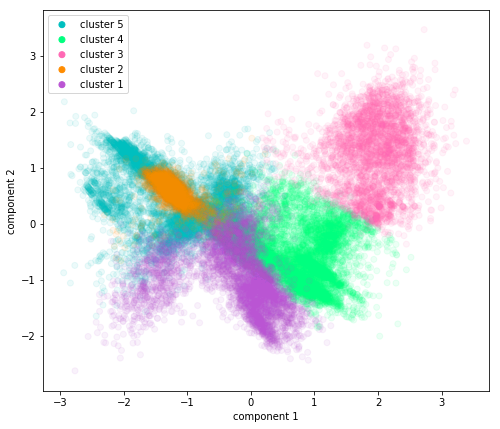

In [241]:
plt.figure(figsize=(8,7))
for clust in [5,4,3,2,1]:
    plt.scatter(pca_plot[pca_plot['cluster']==clust][0], pca_plot[pca_plot['cluster']==clust][1], 
                c=pca_plot[pca_plot['cluster']==clust]['cmap'], alpha=0.075, label="cluster "+str(clust))
plt.xlabel('component 1')
plt.ylabel('component 2')
leg = plt.legend()
for lh in leg.legendHandles: 
    lh.set_alpha(1)
print("c5: blue; c4: green; c3: pink; c2: orange; c1: purple")
plt.savefig("figures/PCAplotClusters.png")
plt.show()